# Beholder Instance Segmentation with COCO dataformat
<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

## Install detectron2



In [1]:
# If you're running on a local machine, be sure to follow the installation instructions.
# https://github.com/facebookresearch/detectron2/blob/master/INSTALL.md
# This notebook includes only what's necessary to run in Colab.

# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
# install Detectron2
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
     |████████████████████████████████| 6.6MB 6.8MB/s 
     |████████████████████████████████| 2.2MB 10.4MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2.post20201009-cp36-none-any.whl size=43973 sha256=9fdf8ac42f44feec265eca40f463a67322232c55e6acf7810bacdb903b8bf456
  Stored in directory: /root/.cache/pip/wheels/c4/6f/e5/e0fc4cc73c77dcf086e56570a3eaba64bf5f23d8088caa9fcf
Successfully built fvcore
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.0.0


## Get Beholder Dataset

In [2]:
!wget https://github.com/EthanBehar68/Detectron2BeholderFun/raw/master/BeholderImages.zip --max-redirect=2
!unzip BeholderImages.zip

--2020-10-11 23:22:03--  https://github.com/EthanBehar68/Detectron2BeholderFun/raw/master/BeholderImages.zip
Resolving github.com (github.com)... 192.30.255.112
Connecting to github.com (github.com)|192.30.255.112|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/EthanBehar68/Detectron2BeholderFun/master/BeholderImages.zip [following]
--2020-10-11 23:22:03--  https://raw.githubusercontent.com/EthanBehar68/Detectron2BeholderFun/master/BeholderImages.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22953290 (22M) [application/zip]
Saving to: ‘BeholderImages.zip’

BeholderImages.zip  100%[===================>]  21.89M  74.3MB/s    in 0.3s    

2020-10-11 23:22:04 (74.3 MB/s) - ‘BeholderImages.zip’ sav

## Register Beholder Dataset

In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [4]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("beholder_train", {}, "./BeholderImages/trainval.json", "./BeholderImages/Train")

WARNING [10/11 23:22:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/11 23:22:17 d2.data.datasets.coco]: Loaded 10 images in COCO format from ./BeholderImages/trainval.json


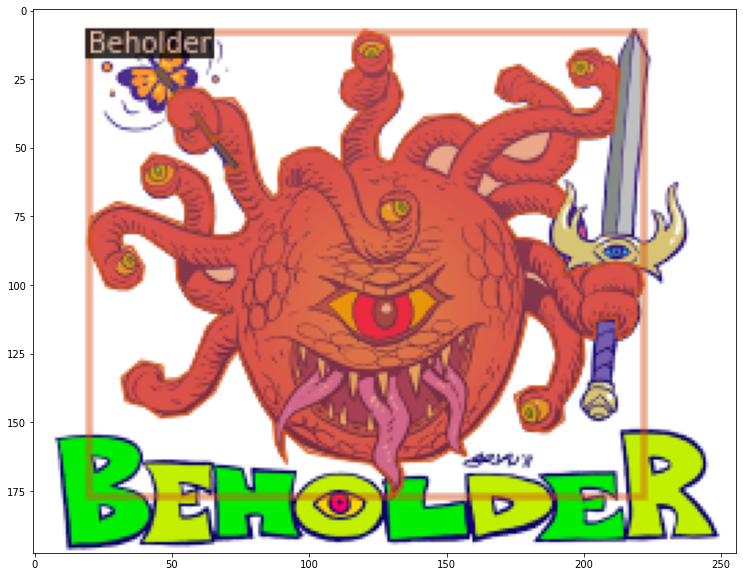

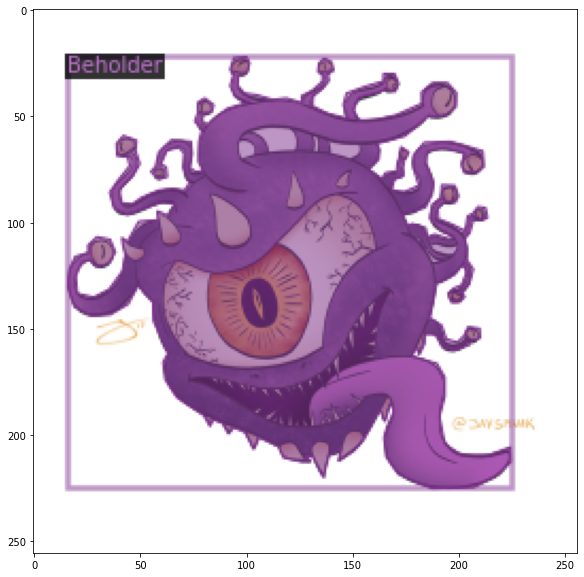

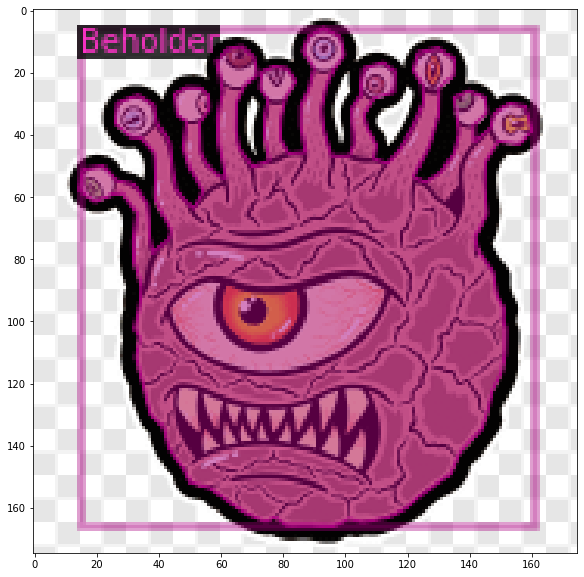

In [5]:
import random
from detectron2.data import DatasetCatalog, MetadataCatalog

beholderDatasetDicts = DatasetCatalog.get("beholder_train")
beholderMetadata = MetadataCatalog.get("beholder_train")

# Uncomment if you want to verify COCO data is loaded correctly

for data in random.sample(beholderDatasetDicts, 3):
    image = cv2.imread(data["file_name"])
    visualizer = Visualizer(image[:, :, ::-1], metadata=beholderMetadata, scale=0.5)
    visualizer = visualizer.draw_dataset_dict(data)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(visualizer.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

## Train model

In [6]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("beholder_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1000
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

# Uncomment if you want to train!

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[10/11 23:22:36 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:04, 41.5MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to

[10/11 23:22:46 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:331: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:331: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_

[10/11 23:22:54 d2.utils.events]:  eta: 0:06:42  iter: 19  total_loss: 2.331  loss_cls: 1.539  loss_box_reg: 0.091  loss_mask: 0.690  loss_rpn_cls: 0.003  loss_rpn_loc: 0.010  time: 0.3973  data_time: 0.0178  lr: 0.000005  max_mem: 2336M
[10/11 23:23:03 d2.utils.events]:  eta: 0:06:36  iter: 39  total_loss: 2.137  loss_cls: 1.362  loss_box_reg: 0.084  loss_mask: 0.681  loss_rpn_cls: 0.002  loss_rpn_loc: 0.009  time: 0.4081  data_time: 0.0072  lr: 0.000010  max_mem: 2444M
[10/11 23:23:10 d2.utils.events]:  eta: 0:06:17  iter: 59  total_loss: 1.770  loss_cls: 1.008  loss_box_reg: 0.092  loss_mask: 0.660  loss_rpn_cls: 0.003  loss_rpn_loc: 0.005  time: 0.3995  data_time: 0.0058  lr: 0.000015  max_mem: 2444M
[10/11 23:23:18 d2.utils.events]:  eta: 0:06:13  iter: 79  total_loss: 1.331  loss_cls: 0.587  loss_box_reg: 0.091  loss_mask: 0.633  loss_rpn_cls: 0.001  loss_rpn_loc: 0.006  time: 0.4012  data_time: 0.0082  lr: 0.000020  max_mem: 2444M
[10/11 23:23:27 d2.utils.events]:  eta: 0:06:07 

## Use model for inference

In [7]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.DATASETS.TEST = ("beholder_eval", )
predictor = DefaultPredictor(cfg)

./BeholderImages/EvalBeholder5.png


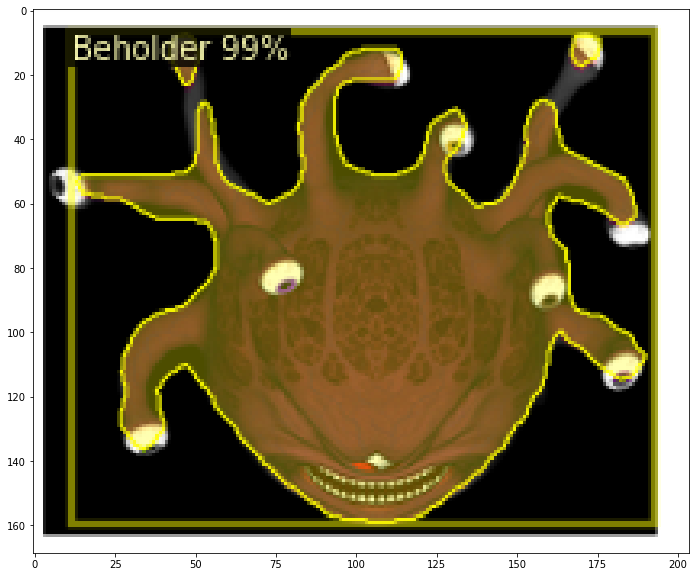

./BeholderImages/EvalBeholder35.png


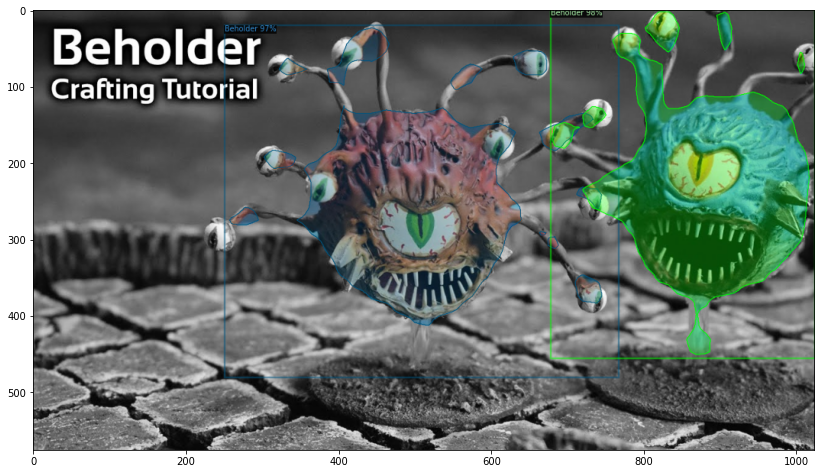

./BeholderImages/EvalBeholder59.png


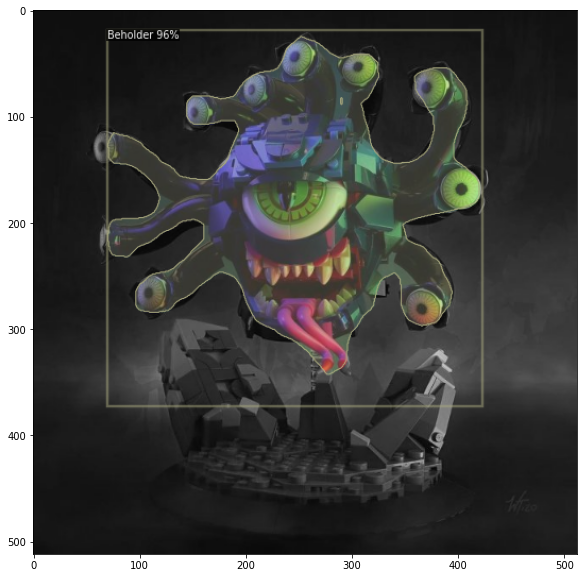

./BeholderImages/EvalBeholder20.png


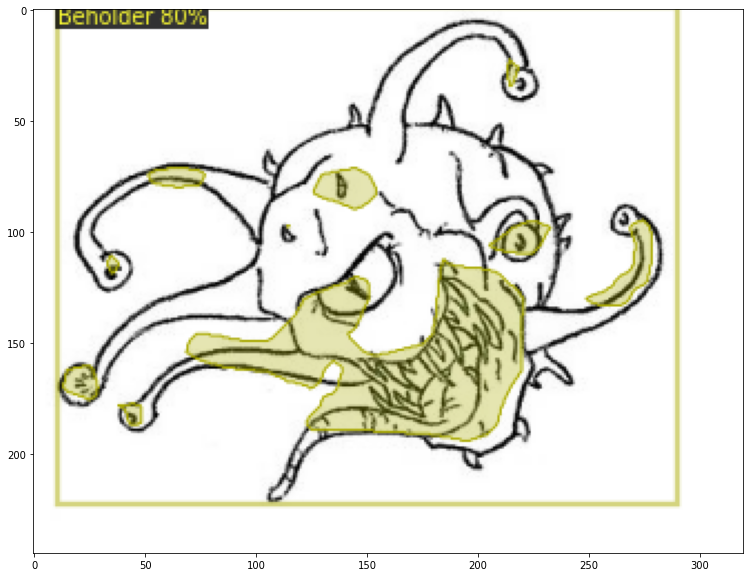

./BeholderImages/EvalBeholder60.png


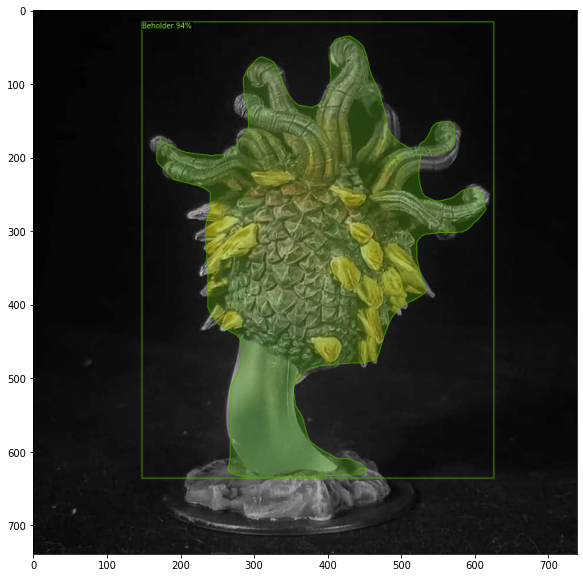

./BeholderImages/EvalBeholder8.png


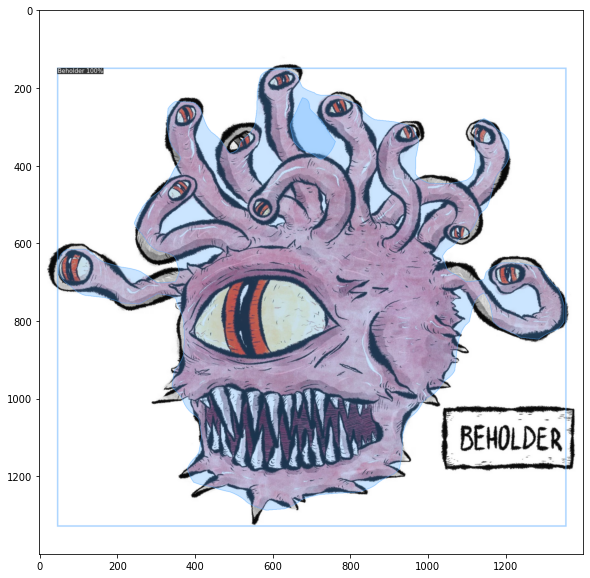

./BeholderImages/EvalBeholder17.png


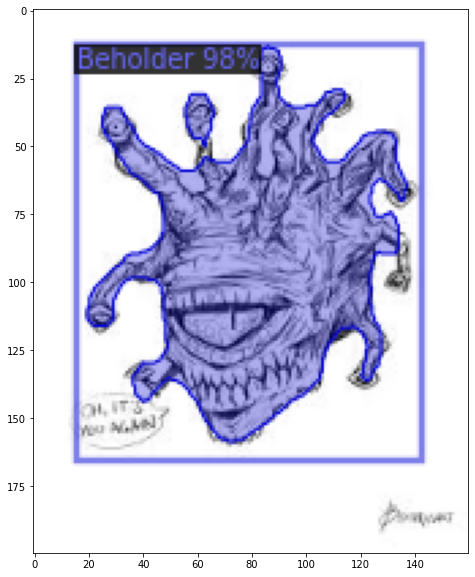

./BeholderImages/EvalBeholder47.png


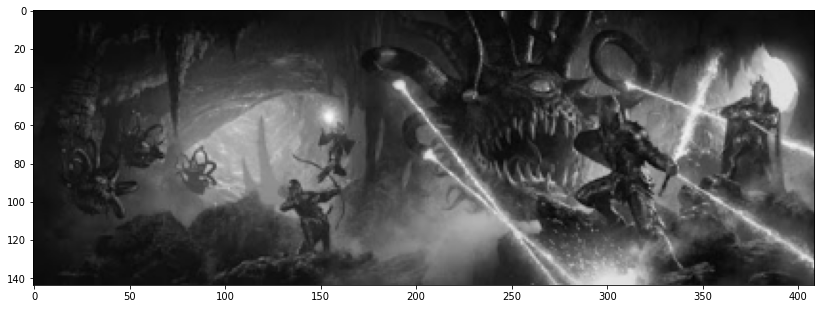

./BeholderImages/EvalBeholder61.png


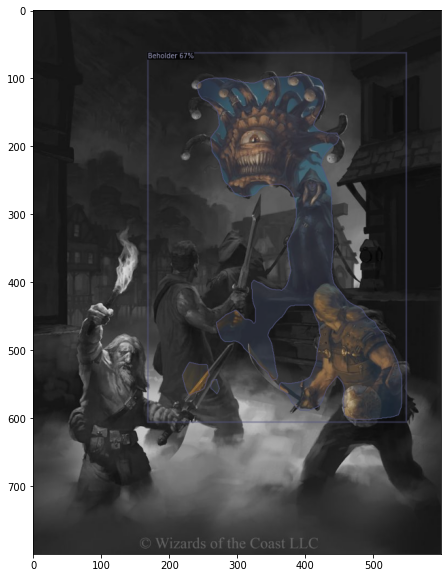

./BeholderImages/EvalBeholder19.png


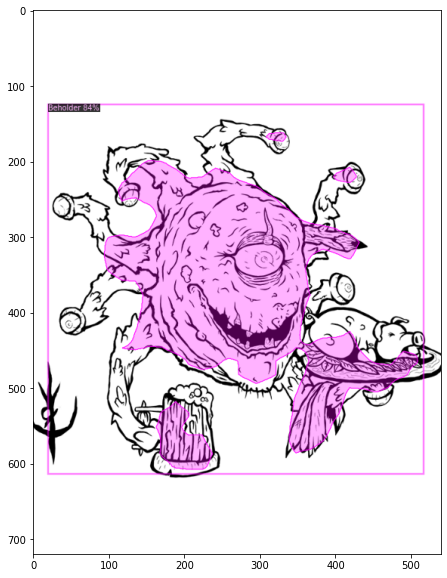

./BeholderImages/EvalBeholder16.png


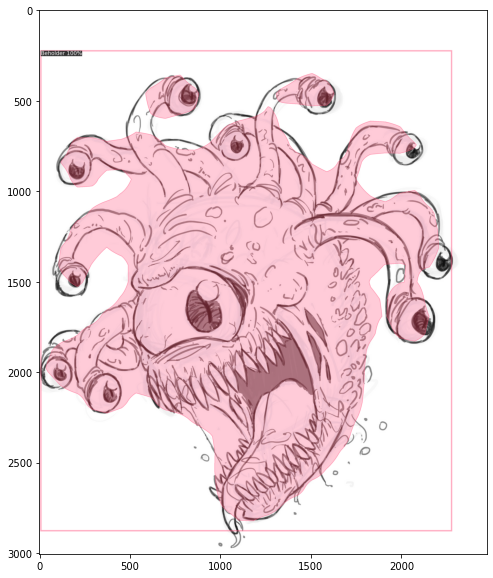

./BeholderImages/EvalBeholder42.png


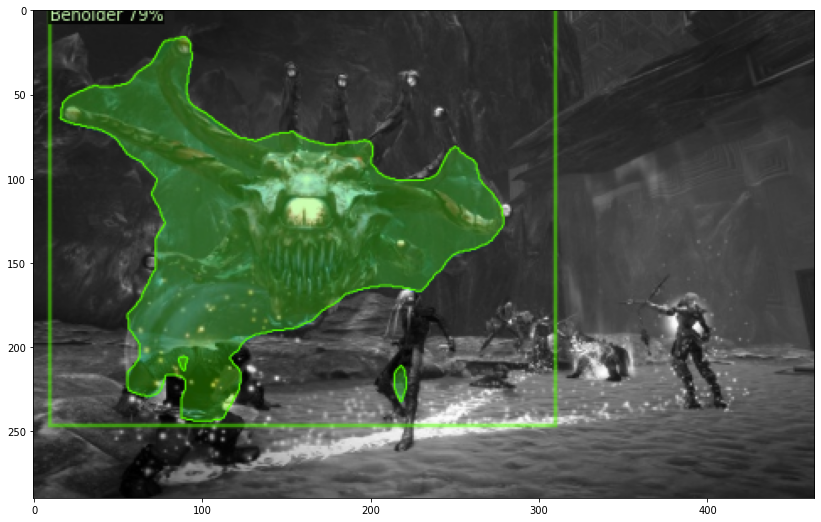

./BeholderImages/EvalBeholder36.png


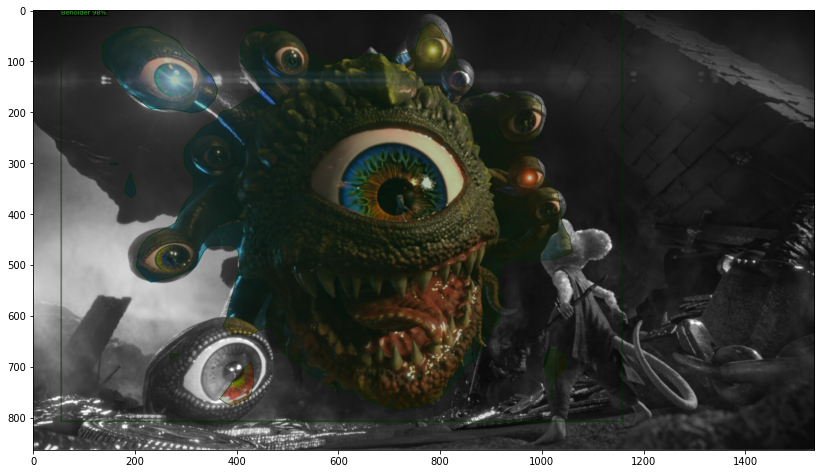

./BeholderImages/EvalBeholder58.png


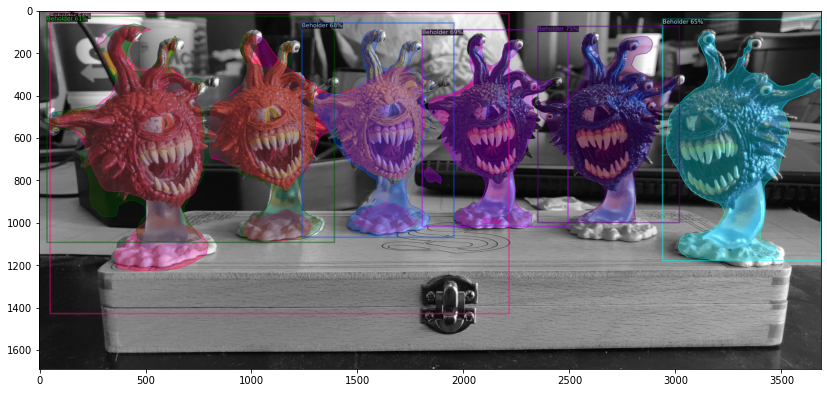

./BeholderImages/EvalBeholder46.png


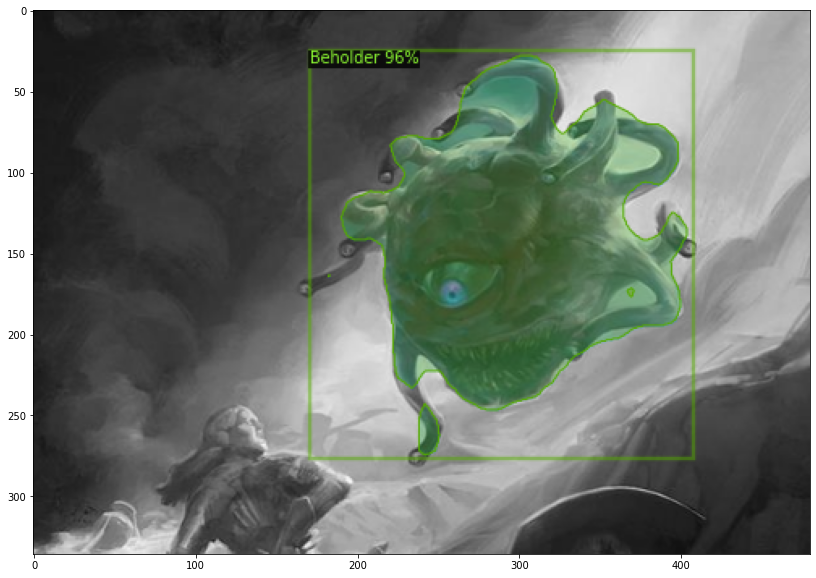

./BeholderImages/EvalBeholder43.png


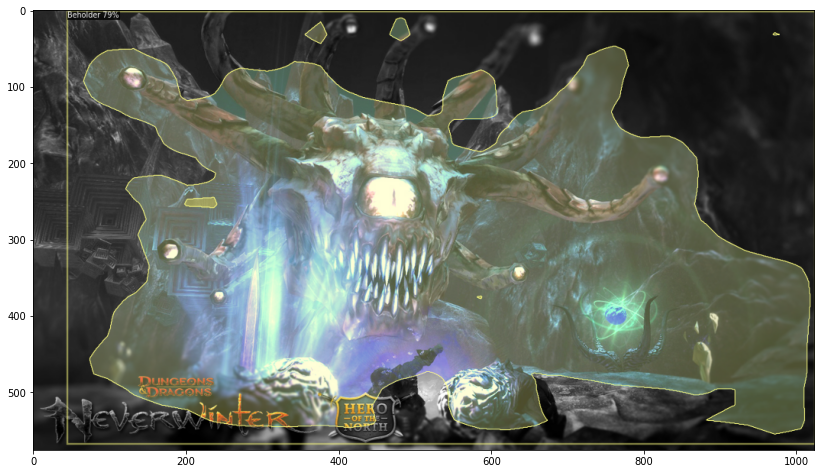

./BeholderImages/EvalBeholder29.png


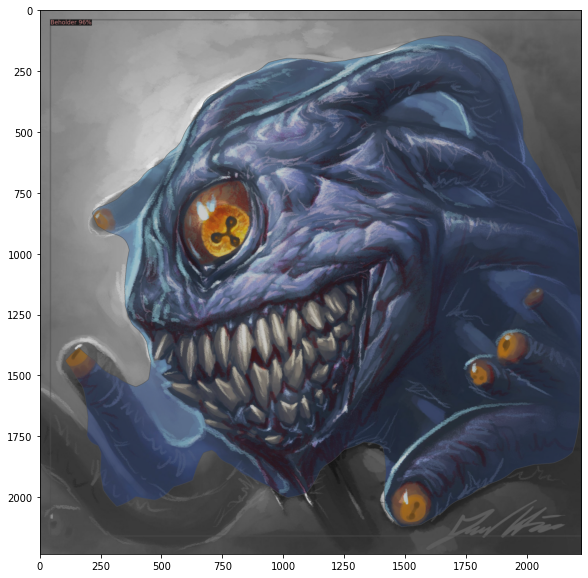

./BeholderImages/EvalBeholder28.png


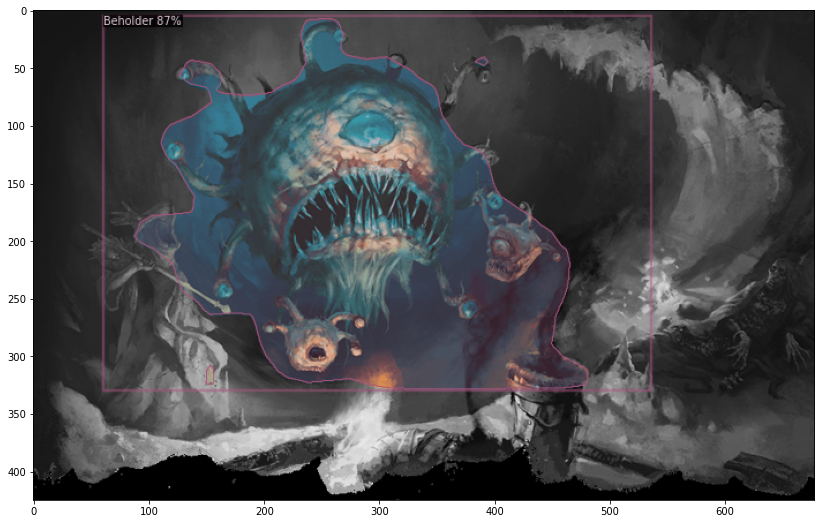

./BeholderImages/EvalBeholder56.png


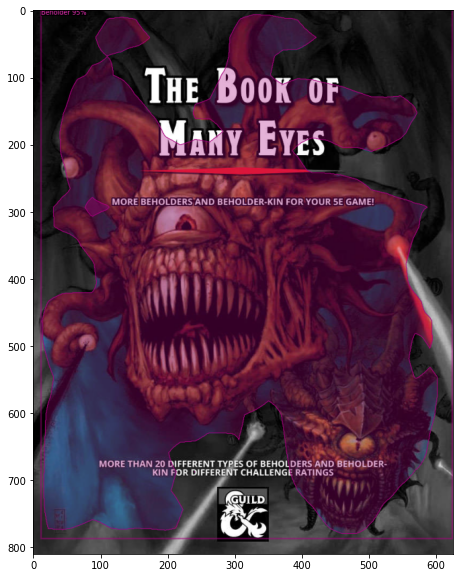

./BeholderImages/EvalBeholder57.png


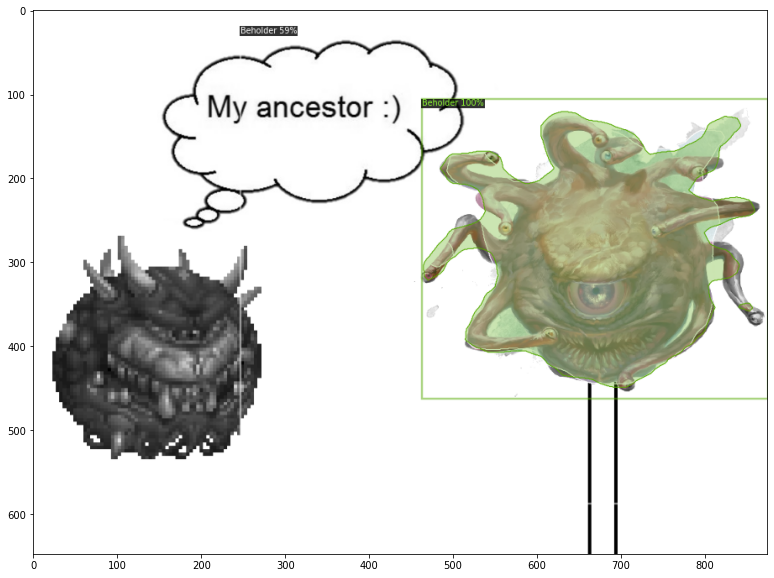

./BeholderImages/EvalBeholder50.png


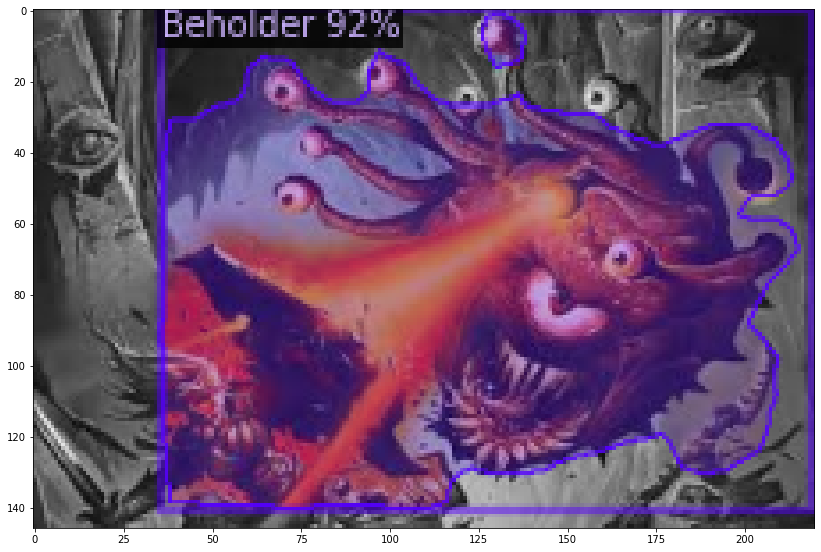

./BeholderImages/EvalBeholder26.png


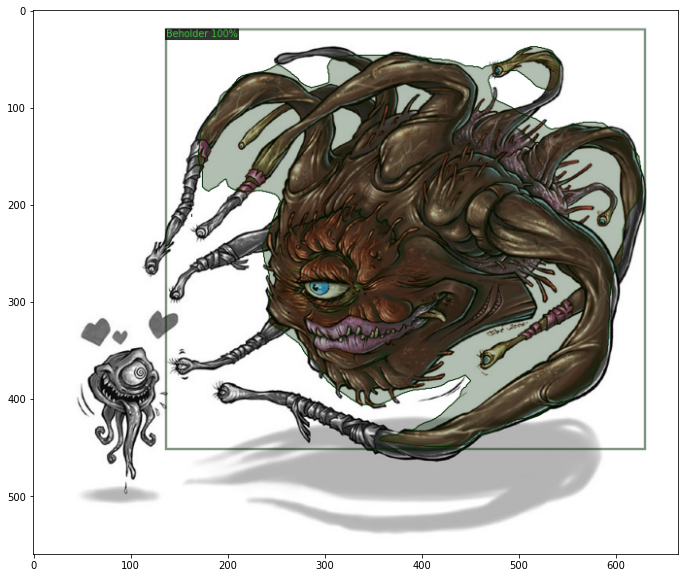

./BeholderImages/EvalBeholder49.png


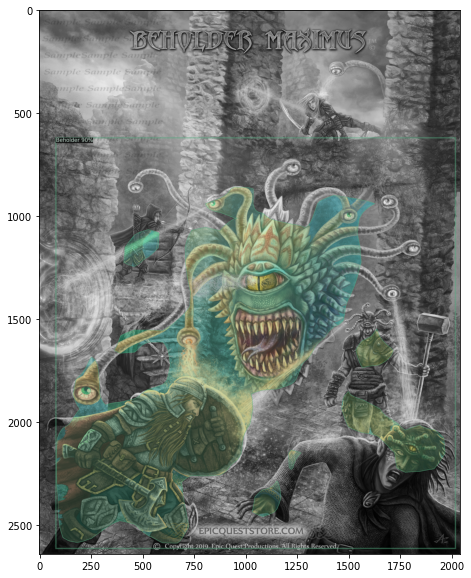

./BeholderImages/EvalBeholder27.png


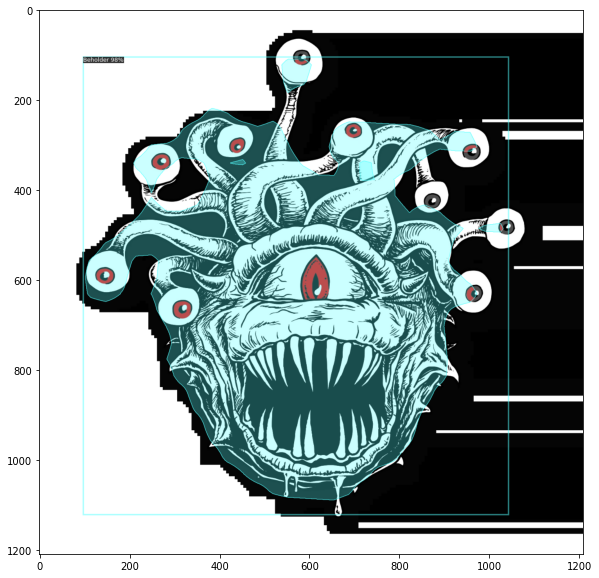

./BeholderImages/EvalBeholder40.png


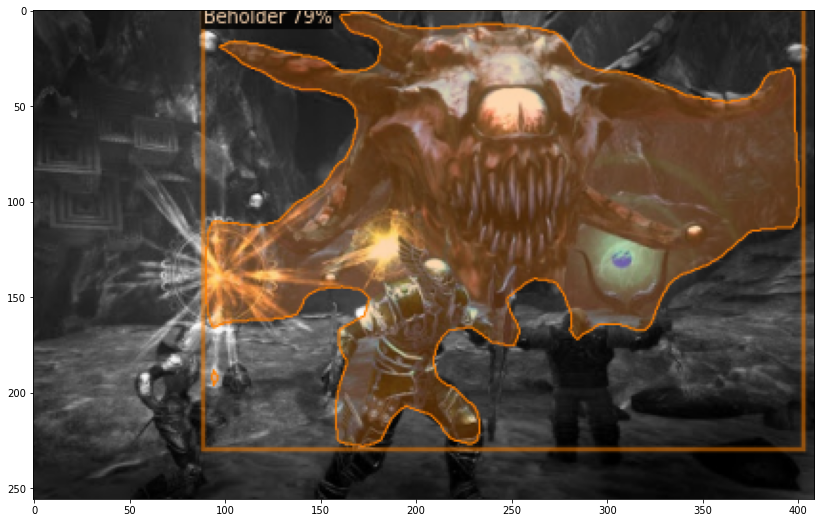

./BeholderImages/EvalBeholder9.png


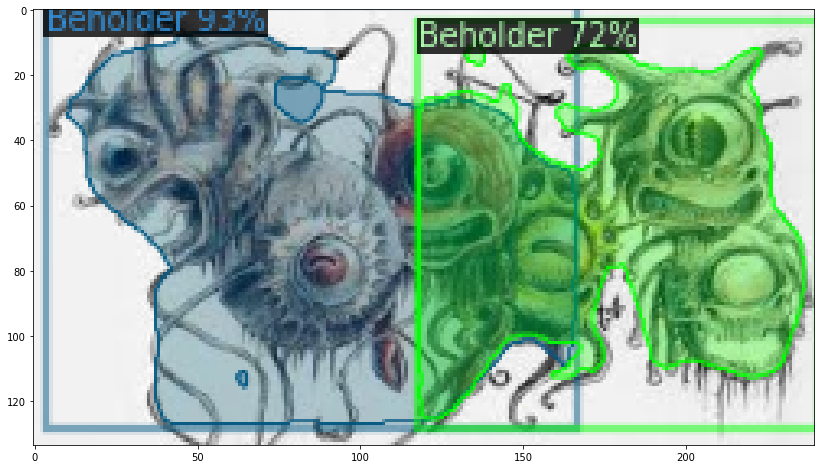

./BeholderImages/EvalBeholder53.png


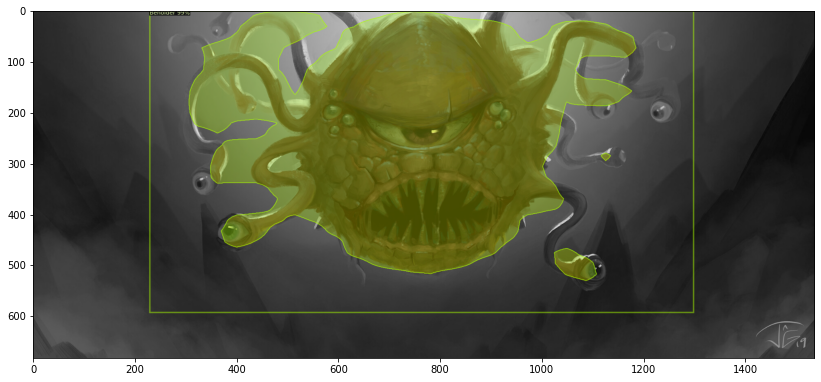

./BeholderImages/EvalBeholder41.png


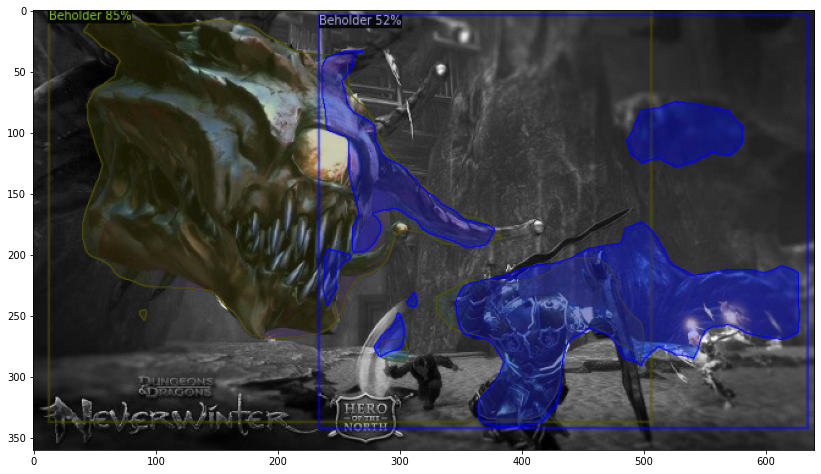

./BeholderImages/EvalBeholder62.png


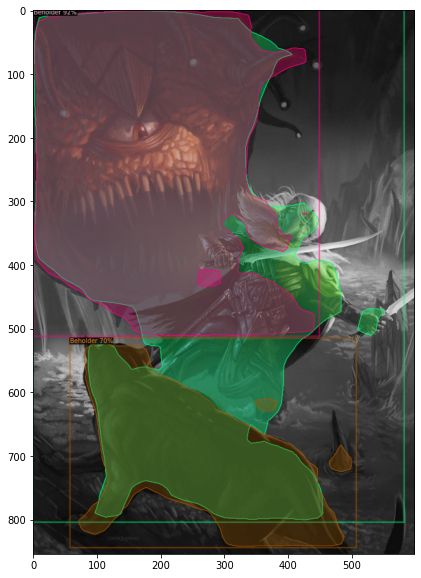

./BeholderImages/EvalBeholder33.png


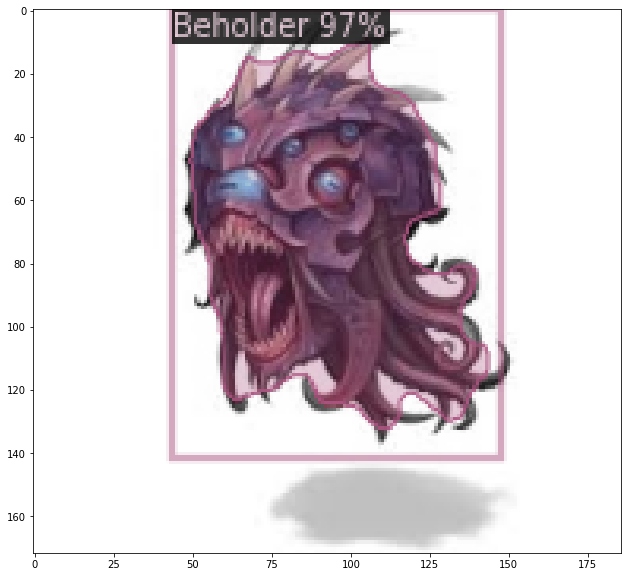

./BeholderImages/EvalBeholder55.png


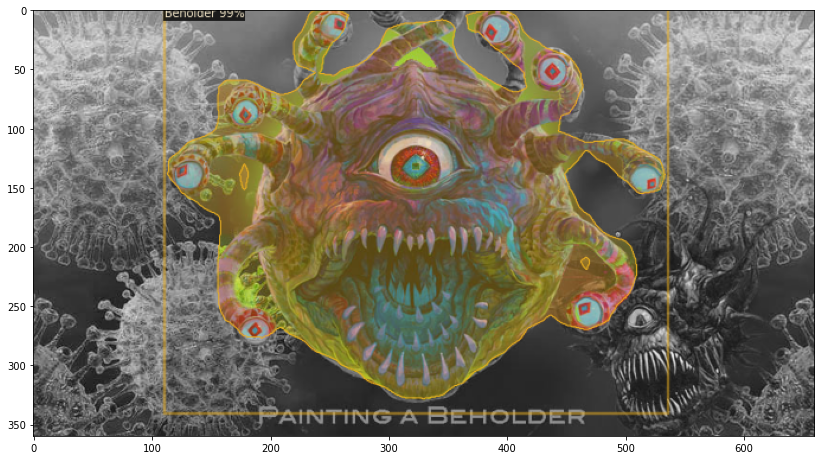

./BeholderImages/EvalBeholder34.png


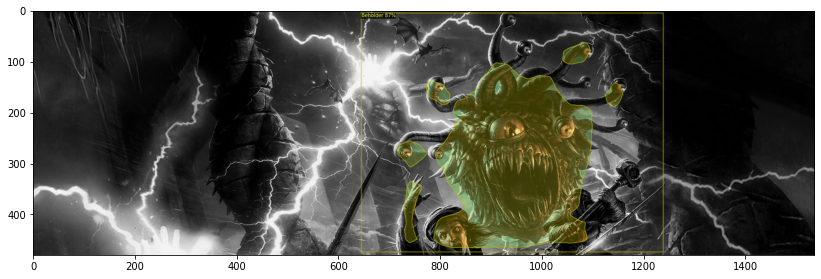

./BeholderImages/EvalBeholder30.png


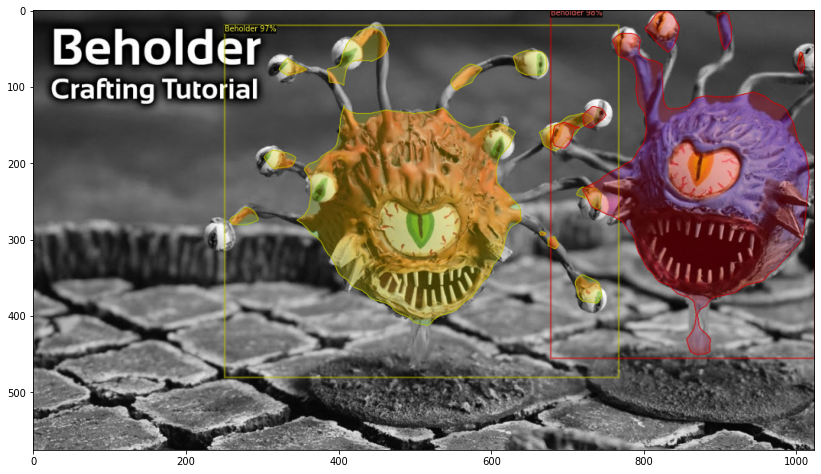

./BeholderImages/EvalBeholder37.png


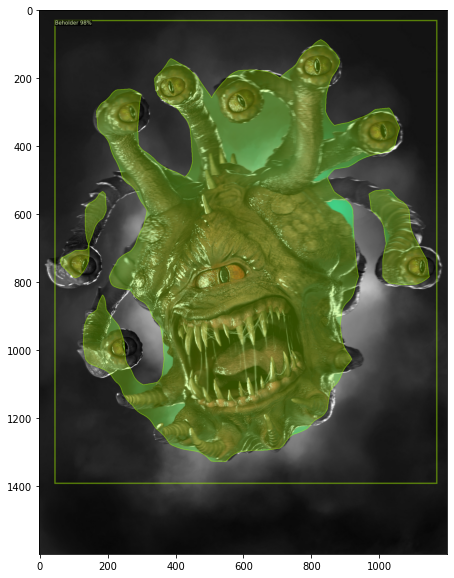

./BeholderImages/EvalBeholder21.png


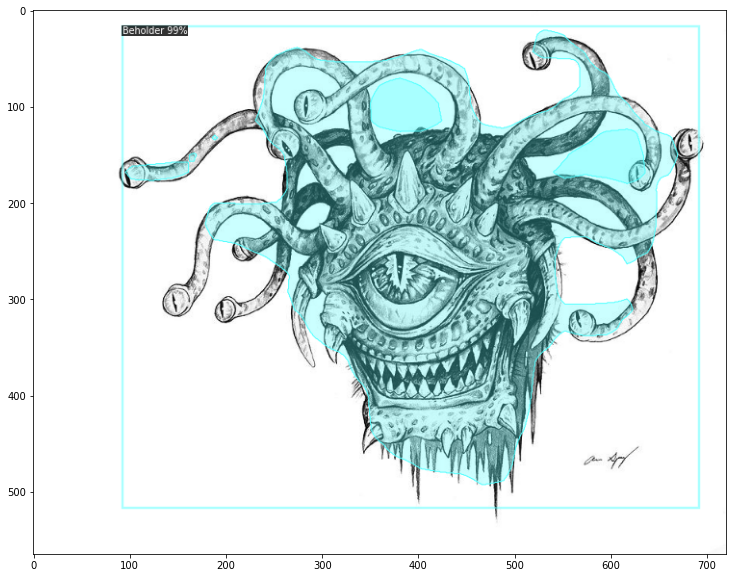

./BeholderImages/EvalBeholder44.png


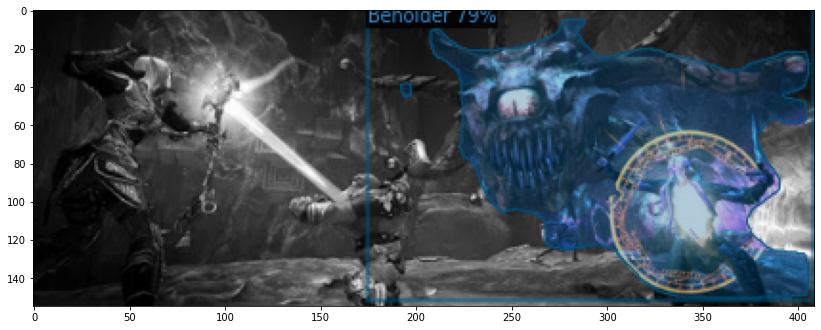

./BeholderImages/EvalBeholder52.png


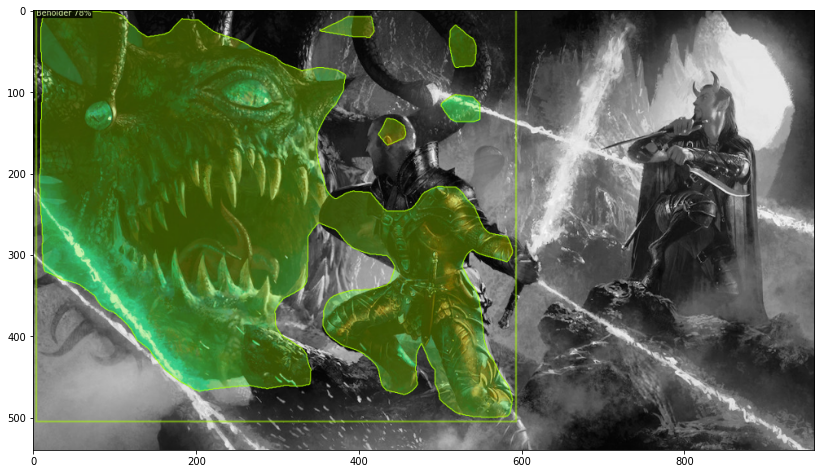

./BeholderImages/EvalBeholder18.png


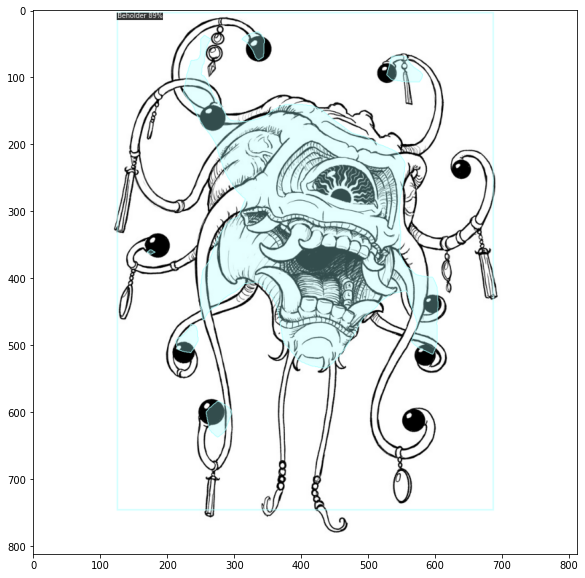

./BeholderImages/EvalBeholder38.png


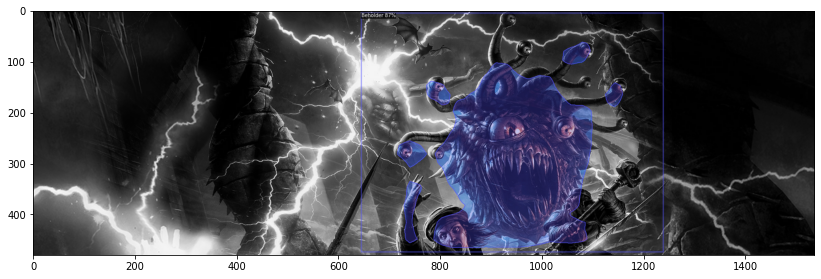

./BeholderImages/EvalBeholder2.png


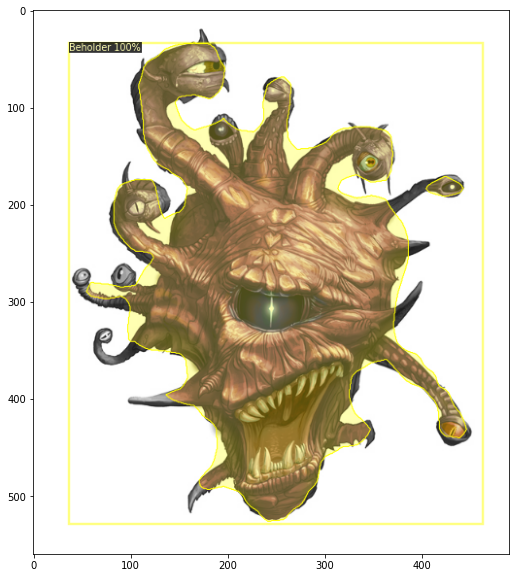

./BeholderImages/EvalBeholder31.png


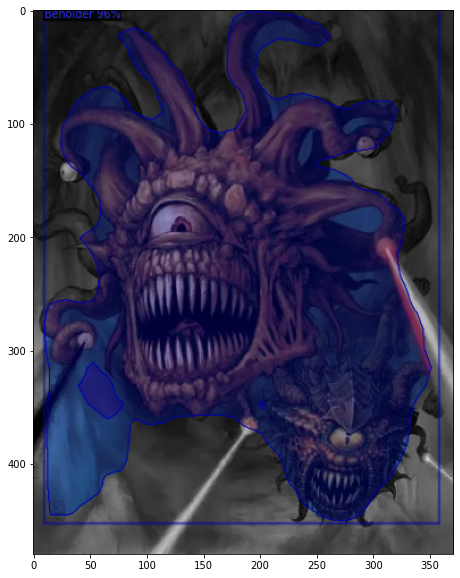

./BeholderImages/EvalBeholder25.png


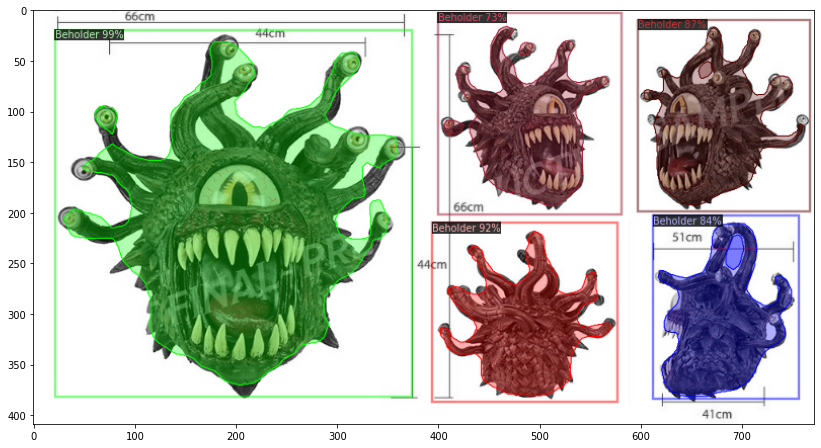

./BeholderImages/EvalBeholder24.png


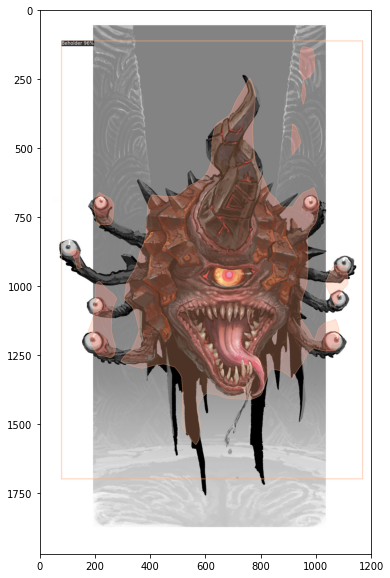

./BeholderImages/EvalBeholder4.png


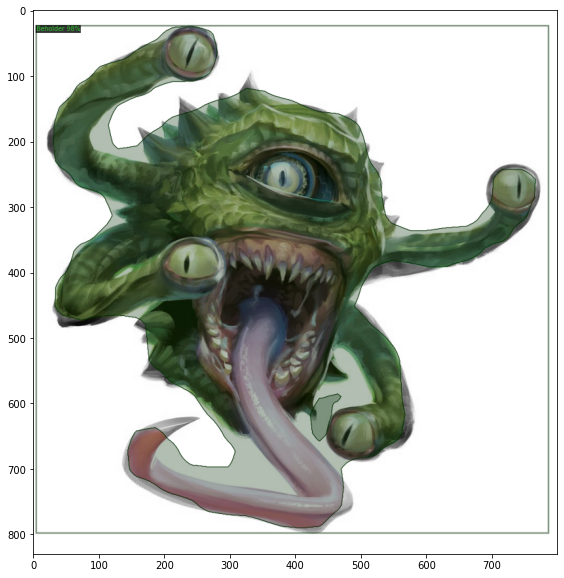

./BeholderImages/EvalBeholder45.png


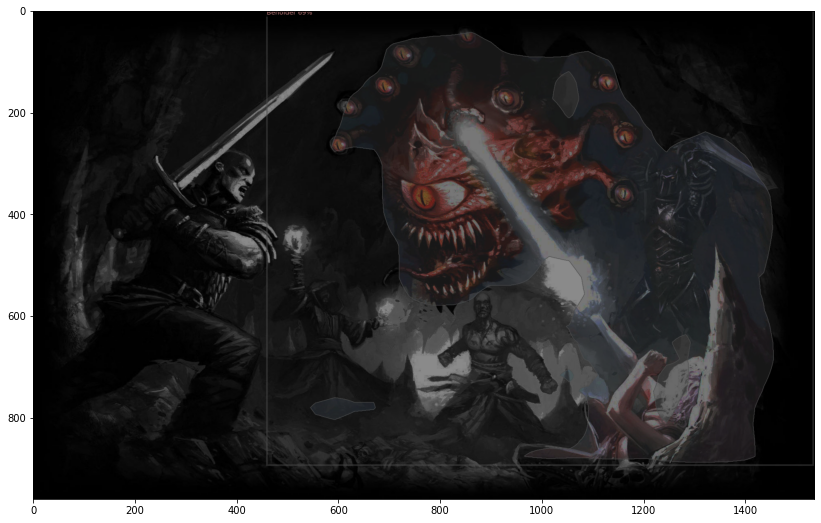

./BeholderImages/EvalBeholder32.png


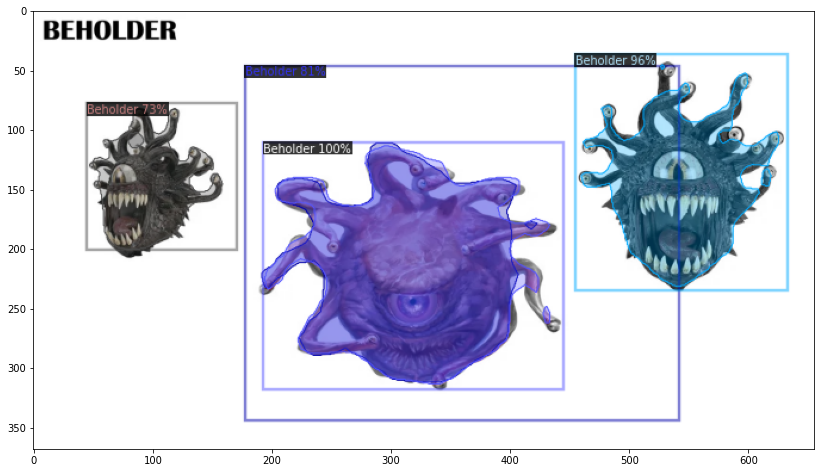

./BeholderImages/EvalBeholder51.png


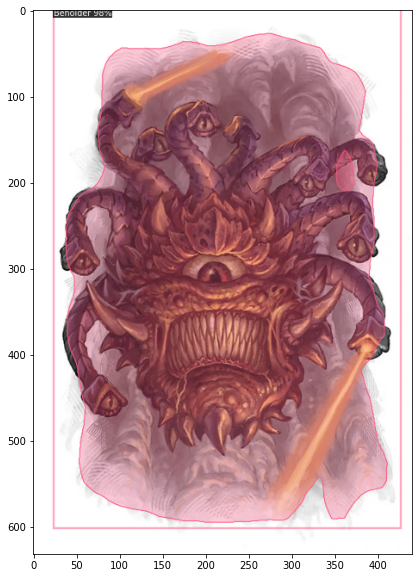

./BeholderImages/EvalBeholder48.png


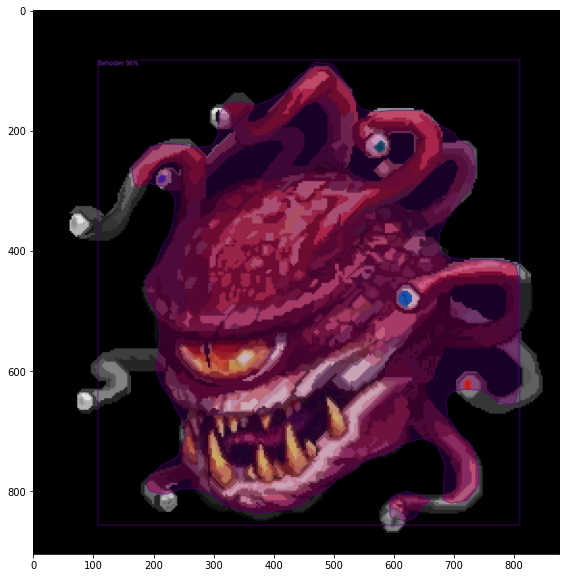

./BeholderImages/EvalBeholder6.png


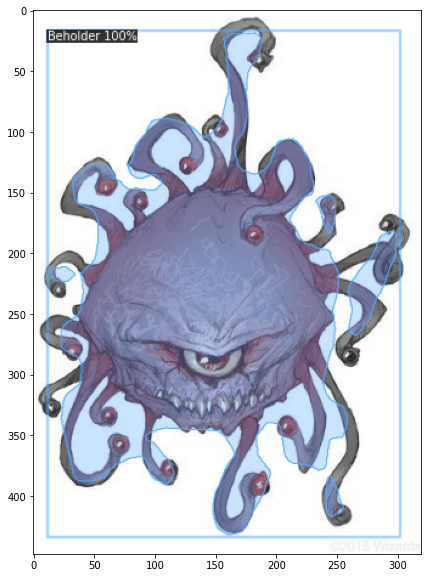

./BeholderImages/EvalBeholder54.png


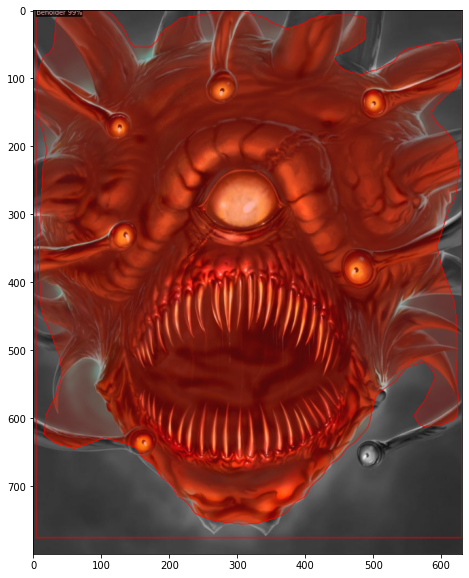

./BeholderImages/EvalBeholder7.png


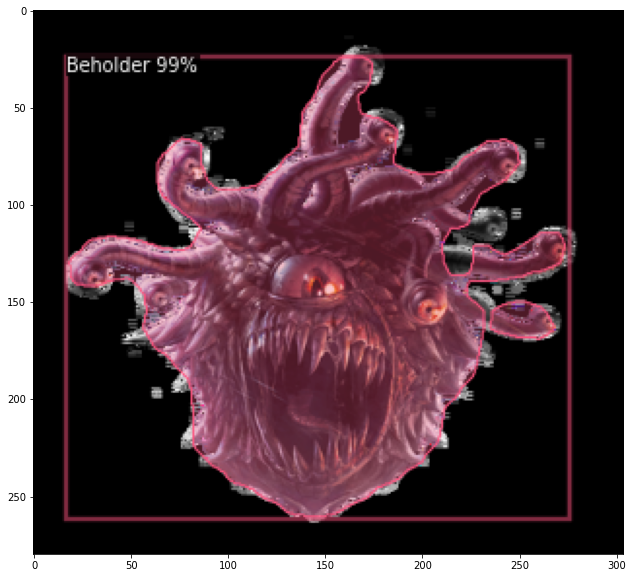

In [10]:
from detectron2.utils.visualizer import ColorMode
beholderImages = [beholder for beholder in os.listdir('./BeholderImages/Eval') if beholder.endswith('.png')]
for fileName in beholderImages:    
    print('./BeholderImages/Eval' + fileName)
    image = cv2.imread('./BeholderImages/Eval/' + fileName)
    outputs = predictor(image)
    visualizer = Visualizer(image[:, :, ::-1],
                   metadata=beholderMetadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    visualizer = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(visualizer.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()